**Install Libraries**

In [ ]:
!pip install -U segmentation-models

**Import Libraries**

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import segmentation_models as sm
import os
import keras
import cv2
from keras.utils import plot_model

Using TensorFlow backend.


Segmentation Models: using `keras` framework.


**Initialize Models and load the updated weights**

In [ ]:
model1=sm.Unet(backbone_name='resnet18',classes=1,activation='sigmoid',input_shape=(1024,1024,3))

44924928/44920640 [==============================] - 4s 0us/step


In [ ]:
model1.load_weights('best_model_U_resnet18_road_v2.h5')

In [ ]:
model2=sm.Linknet(backbone_name='resnet18',classes=1,activation='sigmoid',input_shape=(1024,1024,3))

In [ ]:
model2.load_weights('best_model_Link_resnet18_road_v2.h5')

In [ ]:
model3=sm.FPN(backbone_name='resnet18',classes=1,activation='sigmoid',input_shape=(1024,1024,3))

In [ ]:
model3.load_weights('best_model_FPN_resnet18_road_v2.h5')

In [ ]:
model4=sm.Unet(backbone_name='efficientnetb0',classes=1,activation='sigmoid',input_shape=(1024,1024,3))

16809984/16804768 [==============================] - 2s 0us/step


In [ ]:
model4.load_weights('best_model_U_efficient_road_v2.h5')

In [ ]:
model5=sm.Linknet(backbone_name='efficientnetb0',classes=1,activation='sigmoid',input_shape=(1024,1024,3))

In [ ]:
model5.load_weights('best_model_Link_efficient_road_v2.h5')

In [ ]:
model6=sm.FPN(backbone_name='efficientnetb0',classes=1,activation='sigmoid',input_shape=(1024,1024,3))

In [ ]:
model6.load_weights('best_model_FPN_efficient_road_v2.h5')

**Model Summaries**

In [ ]:
model1.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
data (InputLayer)               (None, 1024, 1024, 3 0                                            
__________________________________________________________________________________________________
bn_data (BatchNormalization)    (None, 1024, 1024, 3 9           data[0][0]                       
__________________________________________________________________________________________________
zero_padding2d_1 (ZeroPadding2D (None, 1030, 1030, 3 0           bn_data[0][0]                    
__________________________________________________________________________________________________
conv0 (Conv2D)                  (None, 512, 512, 64) 9408        zero_padding2d_1[0][0]           
____________________________________________________________________________________________

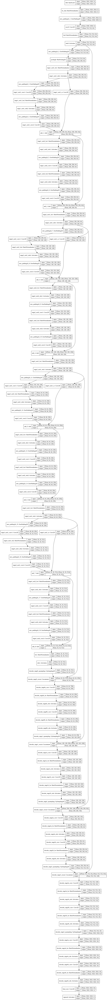

In [ ]:
plot_model(model1, show_shapes=True)

In [ ]:
model2.summary()

Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
data (InputLayer)               (None, 1024, 1024, 3 0                                            
__________________________________________________________________________________________________
bn_data (BatchNormalization)    (None, 1024, 1024, 3 9           data[0][0]                       
__________________________________________________________________________________________________
zero_padding2d_19 (ZeroPadding2 (None, 1030, 1030, 3 0           bn_data[0][0]                    
__________________________________________________________________________________________________
conv0 (Conv2D)                  (None, 512, 512, 64) 9408        zero_padding2d_19[0][0]          
____________________________________________________________________________________________

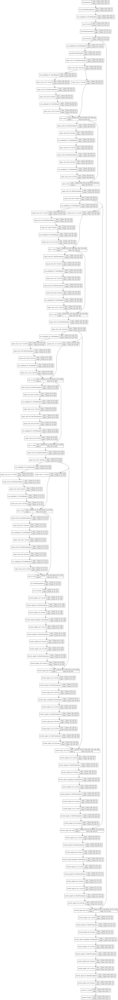

In [ ]:
plot_model(model2, show_shapes=True)

In [ ]:
model3.summary()

Model: "model_6"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
data (InputLayer)               (None, 1024, 1024, 3 0                                            
__________________________________________________________________________________________________
bn_data (BatchNormalization)    (None, 1024, 1024, 3 9           data[0][0]                       
__________________________________________________________________________________________________
zero_padding2d_37 (ZeroPadding2 (None, 1030, 1030, 3 0           bn_data[0][0]                    
__________________________________________________________________________________________________
conv0 (Conv2D)                  (None, 512, 512, 64) 9408        zero_padding2d_37[0][0]          
____________________________________________________________________________________________

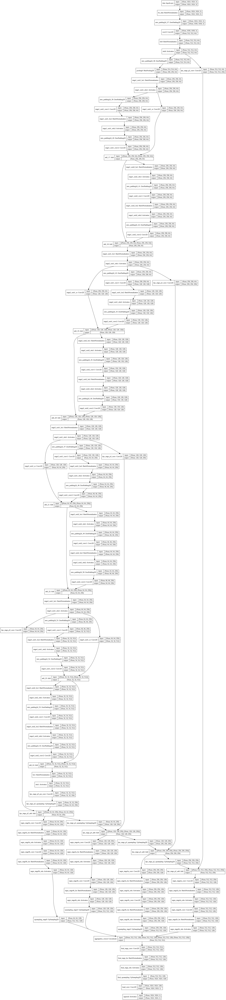

In [ ]:
plot_model(model3, show_shapes=True)

In [ ]:
model4.summary()

Model: "model_7"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 1024, 1024, 3 0                                            
__________________________________________________________________________________________________
stem_conv (Conv2D)              (None, 512, 512, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
stem_bn (BatchNormalization)    (None, 512, 512, 32) 128         stem_conv[0][0]                  
__________________________________________________________________________________________________
stem_activation (Activation)    (None, 512, 512, 32) 0           stem_bn[0][0]                    
____________________________________________________________________________________________

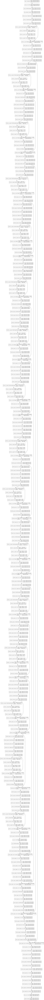

In [ ]:
plot_model(model4, show_shapes=True)

In [ ]:
model5.summary()

Model: "model_8"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            (None, 1024, 1024, 3 0                                            
__________________________________________________________________________________________________
stem_conv (Conv2D)              (None, 512, 512, 32) 864         input_2[0][0]                    
__________________________________________________________________________________________________
stem_bn (BatchNormalization)    (None, 512, 512, 32) 128         stem_conv[0][0]                  
__________________________________________________________________________________________________
stem_activation (Activation)    (None, 512, 512, 32) 0           stem_bn[0][0]                    
____________________________________________________________________________________________

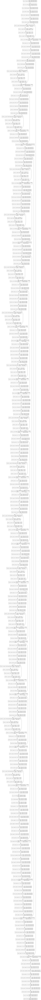

In [ ]:
plot_model(model5, show_shapes=True)

In [ ]:
model6.summary()

Model: "model_9"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, 1024, 1024, 3 0                                            
__________________________________________________________________________________________________
stem_conv (Conv2D)              (None, 512, 512, 32) 864         input_3[0][0]                    
__________________________________________________________________________________________________
stem_bn (BatchNormalization)    (None, 512, 512, 32) 128         stem_conv[0][0]                  
__________________________________________________________________________________________________
stem_activation (Activation)    (None, 512, 512, 32) 0           stem_bn[0][0]                    
____________________________________________________________________________________________

In [ ]:
plot_model(model6, show_shapes=True)

**Single Image Output**


In [ ]:
DATA_DIR = 'drive/My Drive/Final Year Project/Dataset/dataset/test/'

In [ ]:
images=[]
for r,d,f in os.walk(DATA_DIR):
  print(f)
  images=f
  #images.append(f)

['65830_sat.jpg', '645286_sat.jpg', '658596_sat.jpg', '659975_sat.jpg', '660549_sat.jpg', '660817_sat.jpg', '661548_sat.jpg', '664914_sat.jpg', '673714_sat.jpg', '674389_sat.jpg', '662280_sat.jpg', '675857_sat.jpg', '668703_sat.jpg', '677446_sat.jpg', '678696_sat.jpg', '679128_sat.jpg', '677417_sat.jpg', '680455_sat.jpg', '672357_sat.jpg', '680576_sat.jpg', '680975_sat.jpg', '672803_sat.jpg', '681063_sat.jpg', '682158_sat.jpg', '682203_sat.jpg', '682416_sat.jpg', '682259_sat.jpg', '683523_sat.jpg', '683871_sat.jpg', '689049_sat.jpg', '687413_sat.jpg', '690111_sat.jpg', '691162_sat.jpg', '691568_sat.jpg', '684196_sat.jpg', '685976_sat.jpg', '69274_sat.jpg', '692923_sat.jpg', '693135_sat.jpg', '693439_sat.jpg', '685810_sat.jpg', '694118_sat.jpg', '694305_sat.jpg', '686257_sat.jpg', '695515_sat.jpg', '695975_sat.jpg', '696700_sat.jpg', '695727_sat.jpg', '696782_sat.jpg', '701531_sat.jpg', '699265_sat.jpg', '702425_sat.jpg', '702544_sat.jpg', '70372_sat.jpg', '700643_sat.jpg', '703888_sat.

In [ ]:
images[0]

'65830_sat.jpg'

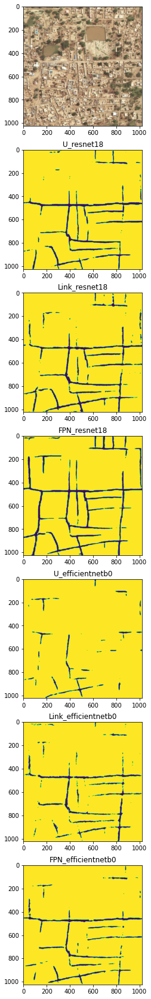

In [ ]:
i=2
image = cv2.imread(os.path.join(DATA_DIR,images[i]))
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
#plt.figure(figsize=(60,60))
f, axarr = plt.subplots(7,1,figsize=(30,30)) 
axarr[0].imshow(image)
axarr[1].title.set_text('U_resnet18')
axarr[1].imshow(np.squeeze(model1.predict(image.reshape(1,1024,1024,3)).round()))
axarr[2].title.set_text('Link_resnet18')
axarr[2].imshow(np.squeeze(model2.predict(image.reshape(1,1024,1024,3)).round()))
axarr[3].title.set_text('FPN_resnet18')
axarr[3].imshow(np.squeeze(model3.predict(image.reshape(1,1024,1024,3)).round()))
axarr[4].title.set_text('U_efficientnetb0')
axarr[4].imshow(np.squeeze(model4.predict(image.reshape(1,1024,1024,3)).round()))
axarr[5].title.set_text('Link_efficientnetb0')
axarr[5].imshow(np.squeeze(model5.predict(image.reshape(1,1024,1024,3)).round()))
axarr[6].title.set_text('FPN_efficientnetb0')
axarr[6].imshow(np.squeeze(model6.predict(image.reshape(1,1024,1024,3)).round()))

**Plots**

In [ ]:
link_res=pd.read_csv('history_Link_resnet18.csv')
U_res=pd.read_csv('history_U_resnet18.csv')
FPN_res=pd.read_csv('history_FPN_resnet18.csv')
link_eff=pd.read_csv('history_Link_efficient.csv')
U_eff=pd.read_csv('history_U_efficient.csv')
FPN_eff=pd.read_csv('history_FPN_efficient.csv')

In [ ]:
link_res.iloc[:,[6,12]]

,val_recall,recall
0,0.979454,0.902695
1,0.985991,0.975429
2,0.984456,0.979155
3,0.981879,0.981171
4,0.992518,0.982888
5,0.988945,0.984289
6,0.991475,0.985251
7,0.991618,0.986094
8,0.989464,0.986681
9,0.991089,0.987255


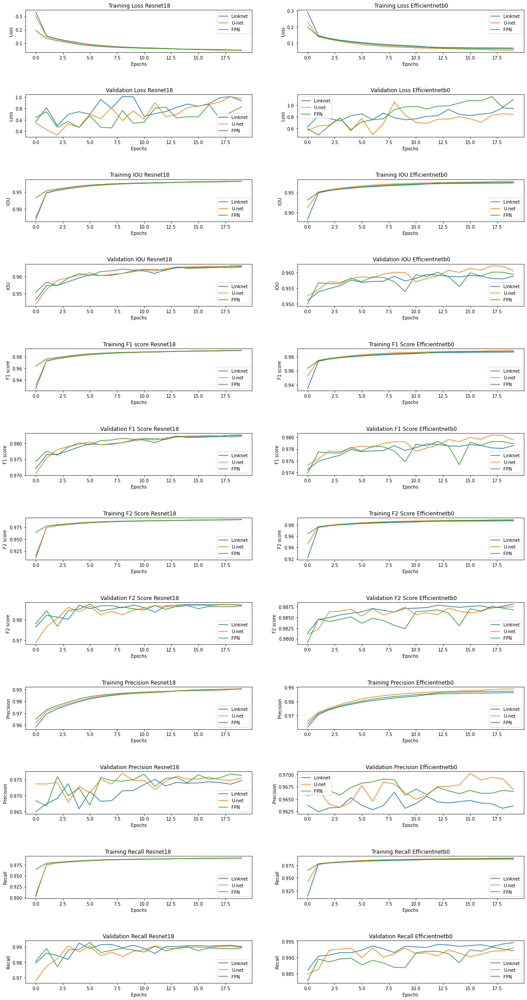

In [ ]:
plt.figure(figsize=(20,40))
plt.subplots_adjust(hspace=1)
plt.subplot(12,2,1)
plt.title(' Training Loss Resnet18')
plt.plot(link_res.iloc[:,[7]].values)
plt.plot(U_res.iloc[:,[7]].values)
plt.plot(FPN_res.iloc[:,[7]].values)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend(['Linknet','U-net','FPN'])


plt.subplot(12,2,2)
plt.title(' Training Loss Efficientnetb0')
plt.plot(link_eff.iloc[:,[7]].values)
plt.plot(U_eff.iloc[:,[7]].values)
plt.plot(FPN_eff.iloc[:,[7]].values)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend(['Linknet','U-net','FPN'])

plt.subplot(12,2,3)
plt.title(' Validation Loss Resnet18')
plt.plot(link_res.iloc[:,[1]].values)
plt.plot(U_res.iloc[:,[1]].values)
plt.plot(FPN_res.iloc[:,[1]].values)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend(['Linknet','U-net','FPN'])


plt.subplot(12,2,4)
plt.title(' Validation Loss Efficientnetb0 ')
plt.plot(link_eff.iloc[:,[1]].values)
plt.plot(U_eff.iloc[:,[1]].values)
plt.plot(FPN_eff.iloc[:,[1]].values)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend(['Linknet','U-net','FPN'])


plt.subplot(12,2,5)
plt.title(' Training IOU Resnet18')
plt.plot(link_res.iloc[:,[8]].values)
plt.plot(U_res.iloc[:,[8]].values)
plt.plot(FPN_res.iloc[:,[8]].values)
plt.xlabel("Epochs")
plt.ylabel("IOU")
plt.legend(['Linknet','U-net','FPN'])


plt.subplot(12,2,6)
plt.title(' Training IOU Efficientnetb0')
plt.plot(link_eff.iloc[:,[8]].values)
plt.plot(U_eff.iloc[:,[8]].values)
plt.plot(FPN_eff.iloc[:,[8]].values)
plt.xlabel("Epochs")
plt.ylabel("IOU")
plt.legend(['Linknet','U-net','FPN'])


plt.subplot(12,2,7)
plt.title(' Validation IOU Resnet18')
plt.plot(link_res.iloc[:,[2]].values)
plt.plot(U_res.iloc[:,[2]].values)
plt.plot(FPN_res.iloc[:,[2]].values)
plt.xlabel("Epochs")
plt.ylabel("IOU")
plt.legend(['Linknet','U-net','FPN'])


plt.subplot(12,2,8)
plt.title(' Validation IOU Efficientnetb0')
plt.plot(link_eff.iloc[:,[2]].values)
plt.plot(U_eff.iloc[:,[2]].values)
plt.plot(FPN_eff.iloc[:,[2]].values)
plt.xlabel("Epochs")
plt.ylabel("IOU")
plt.legend(['Linknet','U-net','FPN'])


plt.subplot(12,2,9)
plt.title('\n Training F1 score Resnet18')
plt.plot(link_res.iloc[:,[9]].values)
plt.plot(U_res.iloc[:,[9]].values)
plt.plot(FPN_res.iloc[:,[9]].values)
plt.xlabel("Epochs")
plt.ylabel("F1 score")
plt.legend(['Linknet','U-net','FPN'])


plt.subplot(12,2,10)
plt.title(' Training F1 Score Efficientnetb0')
plt.plot(link_eff.iloc[:,[9]].values)
plt.plot(U_eff.iloc[:,[9]].values)
plt.plot(FPN_eff.iloc[:,[9]].values)
plt.xlabel("Epochs")
plt.ylabel("F1 score")
plt.legend(['Linknet','U-net','FPN'])


plt.subplot(12,2,11)
plt.title(' Validation F1 Score Resnet18')
plt.plot(link_res.iloc[:,[3]].values)
plt.plot(U_res.iloc[:,[3]].values)
plt.plot(FPN_res.iloc[:,[3]].values)
plt.xlabel("Epochs")
plt.ylabel("F1 score")
plt.legend(['Linknet','U-net','FPN'])


plt.subplot(12,2,12)
plt.title(' Validation F1 Score Efficientnetb0')
plt.plot(link_eff.iloc[:,[3]].values)
plt.plot(U_eff.iloc[:,[3]].values)
plt.plot(FPN_eff.iloc[:,[3]].values)
plt.xlabel("Epochs")
plt.ylabel("F1 score")
plt.legend(['Linknet','U-net','FPN'])


plt.subplot(12,2,13)
plt.title(' Training F2 Score Resnet18')
plt.plot(link_res.iloc[:,[10]].values)
plt.plot(U_res.iloc[:,[10]].values)
plt.plot(FPN_res.iloc[:,[10]].values)
plt.xlabel("Epochs")
plt.ylabel("F2 score")
plt.legend(['Linknet','U-net','FPN'])


plt.subplot(12,2,14)
plt.title(' Training F2 Score Efficientnetb0')
plt.plot(link_eff.iloc[:,[10]].values)
plt.plot(U_eff.iloc[:,[10]].values)
plt.plot(FPN_eff.iloc[:,[10]].values)
plt.xlabel("Epochs")
plt.ylabel("F2 score")
plt.legend(['Linknet','U-net','FPN'])


plt.subplot(12,2,15)
plt.title(' Validation F2 Score Resnet18')
plt.plot(link_res.iloc[:,[4]].values)
plt.plot(U_res.iloc[:,[4]].values)
plt.plot(FPN_res.iloc[:,[4]].values)
plt.xlabel("Epochs")
plt.ylabel("F2 score")
plt.legend(['Linknet','U-net','FPN'])


plt.subplot(12,2,16)
plt.title(' Validation F2 Score Efficientnetb0')
plt.plot(link_eff.iloc[:,[4]].values)
plt.plot(U_eff.iloc[:,[4]].values)
plt.plot(FPN_eff.iloc[:,[4]].values)
plt.xlabel("Epochs")
plt.ylabel("F2 score")
plt.legend(['Linknet','U-net','FPN'])


plt.subplot(12,2,17)
plt.title('Training Precision Resnet18')
plt.plot(link_res.iloc[:,[11]].values)
plt.plot(U_res.iloc[:,[11]].values)
plt.plot(FPN_res.iloc[:,[11]].values)
plt.xlabel("Epochs")
plt.ylabel("Precision")
plt.legend(['Linknet','U-net','FPN'])


plt.subplot(12,2,18)
plt.title('Training Precision Efficientnetb0')
plt.plot(link_eff.iloc[:,[11]].values)
plt.plot(U_eff.iloc[:,[11]].values)
plt.plot(FPN_eff.iloc[:,[11]].values)
plt.xlabel("Epochs")
plt.ylabel("Precision")
plt.legend(['Linknet','U-net','FPN'])


plt.subplot(12,2,19)
plt.title(' Validation Precision Resnet18')
plt.plot(link_res.iloc[:,[5]].values)
plt.plot(U_res.iloc[:,[5]].values)
plt.plot(FPN_res.iloc[:,[5]].values)
plt.xlabel("Epochs")
plt.ylabel("Precision")
plt.legend(['Linknet','U-net','FPN'])


plt.subplot(12,2,20)
plt.title(' Validation Precision Efficientnetb0')
plt.plot(link_eff.iloc[:,[5]].values)
plt.plot(U_eff.iloc[:,[5]].values)
plt.plot(FPN_eff.iloc[:,[5]].values)
plt.xlabel("Epochs")
plt.ylabel("Precision")
plt.legend(['Linknet','U-net','FPN'])


plt.subplot(12,2,21)
plt.title('Training Recall Resnet18 ')
plt.plot(link_res.iloc[:,[12]].values)
plt.plot(U_res.iloc[:,[12]].values)
plt.plot(FPN_res.iloc[:,[12]].values)
plt.xlabel("Epochs")
plt.ylabel("Recall")
plt.legend(['Linknet','U-net','FPN'])


plt.subplot(12,2,22)
plt.title('Training Recall Efficientnetb0')
plt.plot(link_eff.iloc[:,[12]].values)
plt.plot(U_eff.iloc[:,[12]].values)
plt.plot(FPN_eff.iloc[:,[12]].values)
plt.xlabel("Epochs")
plt.ylabel("Recall")
plt.legend(['Linknet','U-net','FPN'])


plt.subplot(12,2,23)
plt.title('Validation Recall Resnet18')
plt.plot(link_res.iloc[:,[6]].values)
plt.plot(U_res.iloc[:,[6]].values)
plt.plot(FPN_res.iloc[:,[6]].values)
plt.xlabel("Epochs")
plt.ylabel("Recall")
plt.legend(['Linknet','U-net','FPN'])


plt.subplot(12,2,24)
plt.title('Validation Recall Efficientnetb0')
plt.plot(link_eff.iloc[:,[6]].values)
plt.plot(U_eff.iloc[:,[6]].values)
plt.plot(FPN_eff.iloc[:,[6]].values)
plt.xlabel("Epochs")
plt.ylabel("Recall")
plt.legend(['Linknet','U-net','FPN'])

plt.show()

In [ ]:
#DATA_DIR1 = 'drive/My Drive/Final Year Project/Dataset/Input/'

In [ ]:
#c=[]
## c=f

In [ ]:
#c[0]

In [ ]:
#import matplotlib
#from google.colab import files

In [ ]:
#for i in range(50):
 # image = cv2.imread(os.path.join(DATA_DIR1,c[i]))
  #image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  #matplotlib.image.imsave(c[i], np.squeeze(model6.predict(image.reshape(1,1024,1024,3)).round()))
  #files.download(c[i])